<a href="https://colab.research.google.com/github/DanilDelegator/DanilDelegator.github.io/blob/master/Final_Global_Wheat_Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Global Wheat Detection**

# **Introduction**



This notebook was created by Avraham Toubi and Danil Delegator as part of the Data Science workshop at the Open University of Israel, Summer of 2024.

As we were searching for a topic for the workshop, we came across many interesting databases. We chose to study this database because we believe that the topic has a critical importance to the food industry and can potentially create a meaningful global impact. This research could help address global challenges like climate change and food shortage. By contributing to this field, we hope to be part of a solution that impacts millions of lives, ensuring that this necessity remains accessible to everyone.



###**The Problem**


Wheat is grown in many countries around the world and is a crucial part of many diets worldwide. Its significance as a food source and agricultural crop has made it a well-researched topic as scientists tried to understand how to grow it better and faster. This database was created as part of an attempt to help researchers measure the improvements in the field. The database is a collection of pictures of wheat fields from several countries. The wheat heads in each picture are marked in a separate file so by analyzing this database, researchers can estimate the density and size of wheat heads in various varieties.
Detecting wheat heads accurately in outdoor field pictures is a significant challenge. Dense planting in fields often causes overlapping wheat heads, and wind can blur photographs, making it hard to identify individual heads. Furthermore, variations in maturity, color, genotype, and head orientation add complexity. Additionally, wheat is grown globally under diverse conditions, with differing varieties, planting patterns, soil and other environmental factors. A good model this database must overcome regional biases and generalize effectively across all these varying conditions.

**Here is an example of a collage of several different pictures in the database:**

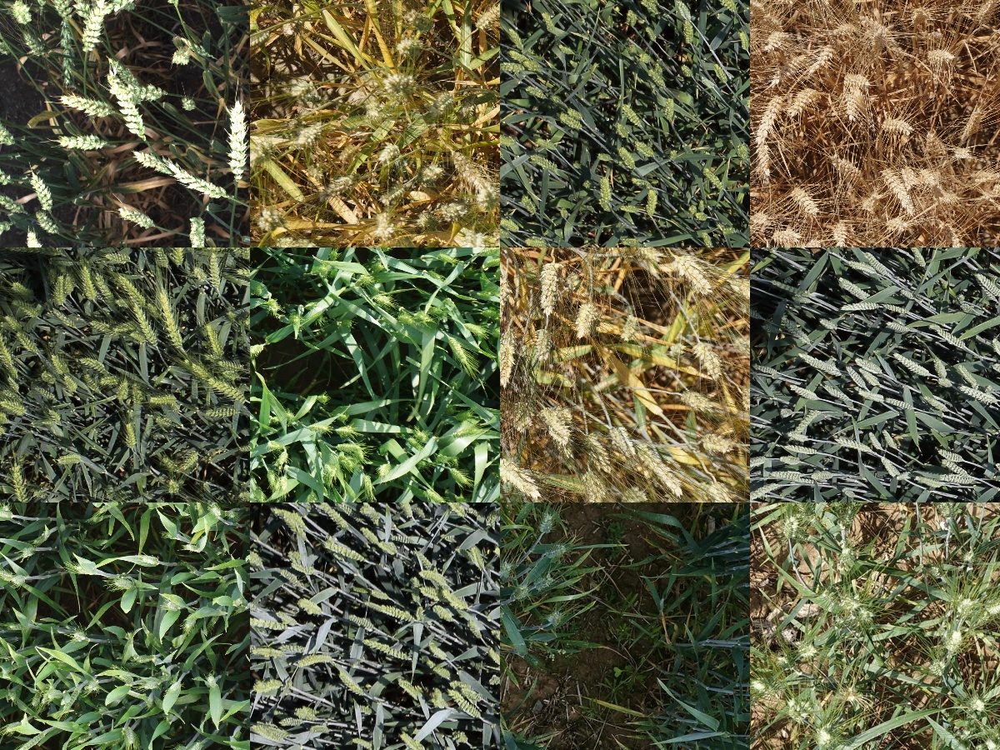

As you can see, the pictures differ in many aspects which will probably give us a hard time trying to find the best algorithm to identify the wheat-heads in the picture.

# **EDA**

### **Setting up the Environment**


Before we begin our analysis, let's import the necessary libraries and download the dataset, and unzip to acccess its contents.

In [1]:
!pip install wandb -qU
import wandb
import ast
import os
import zipfile
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import urllib.request
import skimage.io
import cv2
import numpy as np
import glob
import torch
import torchvision.transforms as transforms
import torch.nn as nn
import random
import tqdm
import math
import json
import shutil

from tqdm import tqdm
from skimage.feature import hog
from skimage import exposure
from sklearn.cluster import MiniBatchKMeans
from torchvision import models
from PIL import Image
from sklearn.model_selection import train_test_split
from pycocotools.coco import COCO
from pycocotools.cocoeval import COCOeval

tqdm.pandas()

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.8/20.8 MB 96.7 MB/s eta 0:00:00


In [ ]:
import gdown
import zipfile

FOLDER_PATH = "/content/global-wheat-detection"
ZIP_PATH = f"{FOLDER_PATH}.zip"
GOOGLE_DRIVE_ID = "1UJ63Wm4vC_caxU4sM5NW9u-CyLhoKyvy"

if not os.path.exists(FOLDER_PATH):
  gdown.download(id=GOOGLE_DRIVE_ID)

  with zipfile.ZipFile(ZIP_PATH, 'r') as zip_file:
      zip_file.extractall(FOLDER_PATH)

Downloading...
From (original): https://drive.google.com/uc?id=1UJ63Wm4vC_caxU4sM5NW9u-CyLhoKyvy
From (redirected): https://drive.google.com/uc?id=1UJ63Wm4vC_caxU4sM5NW9u-CyLhoKyvy&confirm=t&uuid=47126f19-77b1-4078-b6bd-3c73ecc88582
To: /content/global-wheat-detection.zip
100%|██████████| 637M/637M [00:05<00:00, 110MB/s]


With the dataset unzipped, we can now load the data into our environment for further exploration and analysis.

### **Data Loading and Exploration**

Let's load the training data (`train.csv`) and examine its structure. This file contains information about the images, such as their filenames and the corresponding bounding boxes for wheat heads.

* image_id - the unique image ID
* width - the width of the image
* height - the height of the image
* bbox - a bounding box of the wheat in the image as a Python-style list of [xmin, ymin, width, height]
* source - the source of the image



In [ ]:
train = pd.read_csv(os.path.join('/content/global-wheat-detection', "train.csv"))
train.head()

,image_id,width,height,bbox,source
0,b6ab77fd7,1024,1024,"[834.0, 222.0, 56.0, 36.0]",usask_1
1,b6ab77fd7,1024,1024,"[226.0, 548.0, 130.0, 58.0]",usask_1
2,b6ab77fd7,1024,1024,"[377.0, 504.0, 74.0, 160.0]",usask_1
3,b6ab77fd7,1024,1024,"[834.0, 95.0, 109.0, 107.0]",usask_1
4,b6ab77fd7,1024,1024,"[26.0, 144.0, 124.0, 117.0]",usask_1


Now that we have loaded the training data, we can perform some exploratory data analysis to gain insights into the dataset.

We analyzed the height and width distributions (both constant at 1024 pixels)


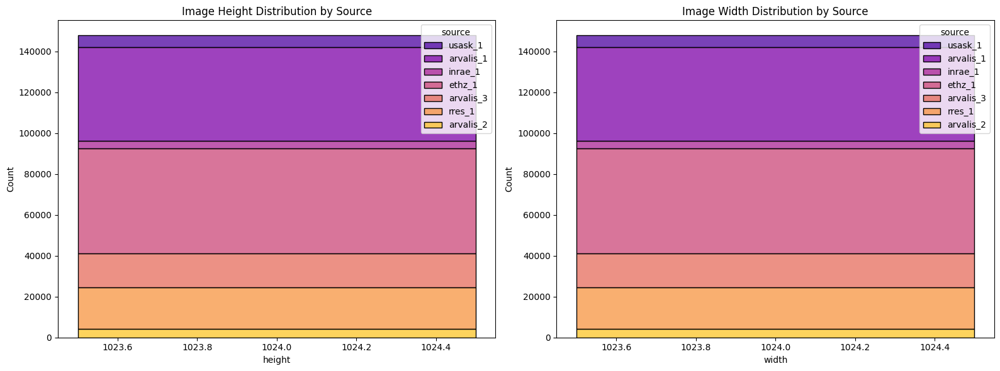

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(16, 6))
sns.histplot(data=train, x='height', hue='source', multiple="stack", ax=axes[0], palette='plasma')
axes[0].set_title('Image Height Distribution by Source')
sns.histplot(data=train, x='width', hue='source', multiple="stack", ax=axes[1], palette='plasma')
axes[1].set_title('Image Width Distribution by Source')
plt.tight_layout()
plt.show()


Then we look at the distributation by the source of the image.

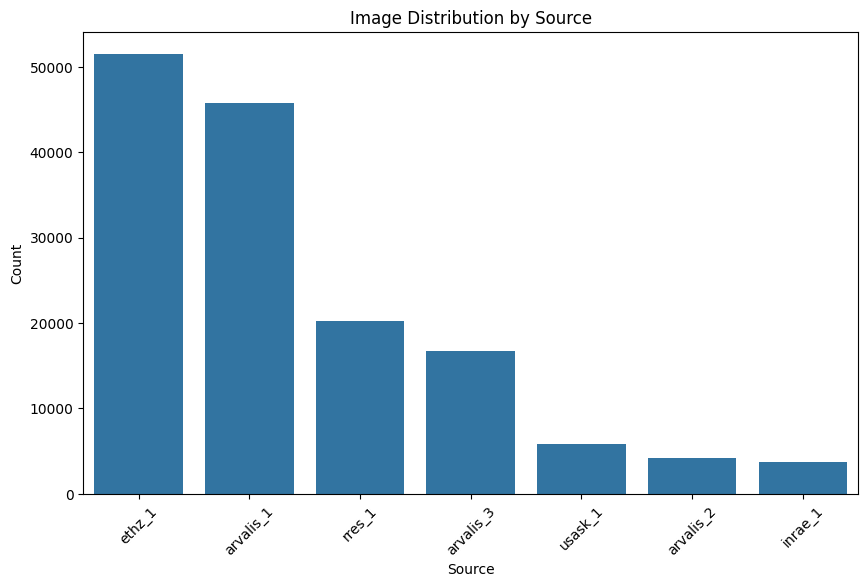

In [ ]:
if 'source' in train.columns:
    plt.figure(figsize=(10, 6))
    sns.countplot(data=train, x='source', order=train['source'].value_counts().index)
    plt.title('Image Distribution by Source')
    plt.xlabel('Source')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.show()

 Then we examined the bounding box areas as a proxy for the scale of wheat heads in the images. By grouping data per image and source, we visualized the distribution of average bounding box areas.

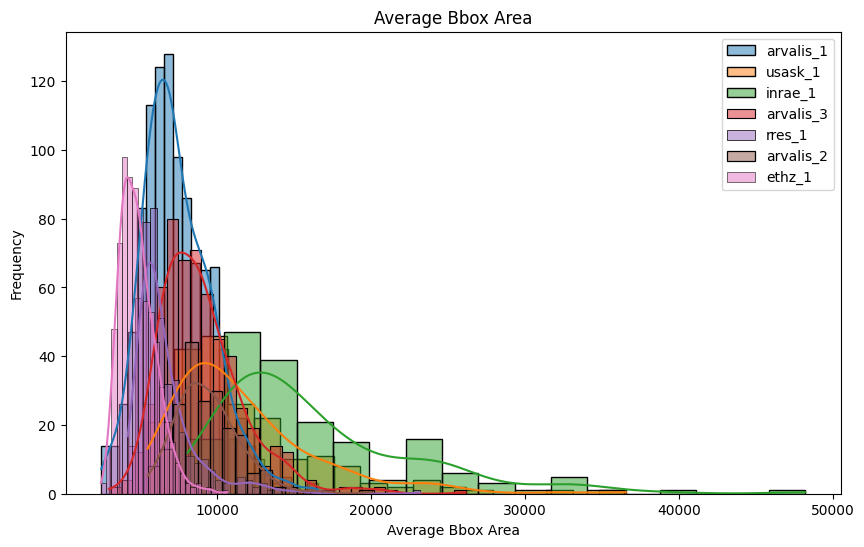

In [ ]:
## Bbox Area
train['literal_bbox'] = train['bbox'].apply(lambda x: list(map(int, ast.literal_eval(x))))
train['bbox_area'] = train['literal_bbox'].apply(lambda x: x[2] * x[3])

# Avg Bbox Area per Image ID
df_grouped = train.groupby(['image_id', 'source']).agg(
    avg_bbox_area = pd.NamedAgg(column='bbox_area', aggfunc='mean'),
).reset_index()

## Graph the result
plt.figure(figsize=(10, 6))
sources = df_grouped['source'].unique()
for source in sources:
    subset = df_grouped[df_grouped['source'] == source]
    sns.histplot(subset['avg_bbox_area'], label=source, kde=True)

plt.title('Average Bbox Area')
plt.xlabel('Average Bbox Area')
plt.ylabel('Frequency')
plt.legend()
plt.show()

Grouping by image allows us to quantify the number of wheat heads per image. This information is vital for understanding the density variation across different sources.

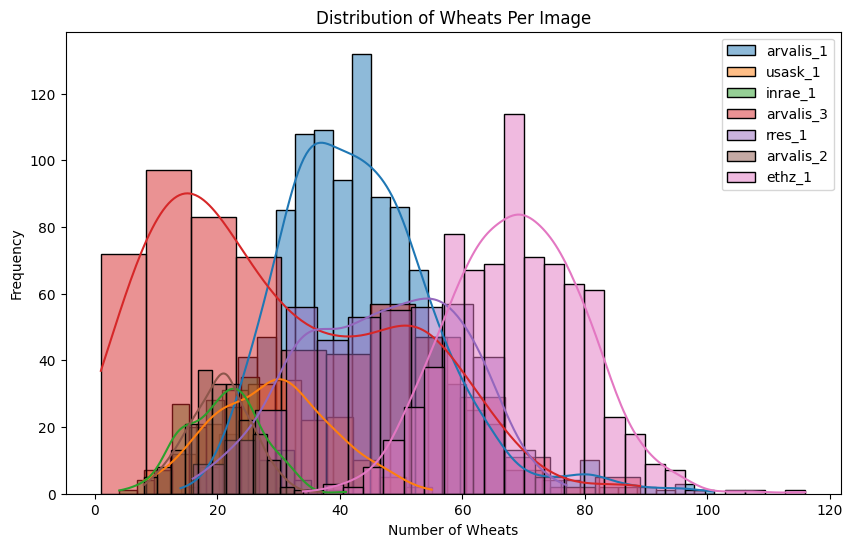

In [ ]:
df_grouped = train.groupby(['image_id', 'source']).agg(
    wheat_count = pd.NamedAgg(column='bbox', aggfunc='count'),
).reset_index()


# Plotting
plt.figure(figsize=(10, 6))
sources = df_grouped['source'].unique()
for source in sources:
    subset = df_grouped[df_grouped['source'] == source]
    sns.histplot(subset['wheat_count'], label=source, kde=True)

plt.title('Distribution of Wheats Per Image')
plt.xlabel('Number of Wheats')
plt.ylabel('Frequency')
plt.legend()
plt.show()

Now we load the actual image data to a column in the dataframe. Since there are multiple rows for each image, if we load the image in a straight forward way, we will run out of memory on our machine but using a cache will allow us to load the actual image into memory only once.

In [ ]:
image_cache = {}

def load_image(image_id):
  if image_id in image_cache:
    return image_cache[image_id]
  else:
    image_data = skimage.io.imread(os.path.join(FOLDER_PATH, 'train', f'{image_id}.jpg'))
    image_cache[image_id] = image_data
    return image_data

train['raw_image'] = train['image_id'].apply(load_image)
train.head(5)

,image_id,width,height,bbox,source,literal_bbox,bbox_area,raw_image
0,b6ab77fd7,1024,1024,"[834.0, 222.0, 56.0, 36.0]",usask_1,"[834, 222, 56, 36]",2016,"[[[26, 24, 25], [30, 28, 29], [36, 34, 35], [4..."
1,b6ab77fd7,1024,1024,"[226.0, 548.0, 130.0, 58.0]",usask_1,"[226, 548, 130, 58]",7540,"[[[26, 24, 25], [30, 28, 29], [36, 34, 35], [4..."
2,b6ab77fd7,1024,1024,"[377.0, 504.0, 74.0, 160.0]",usask_1,"[377, 504, 74, 160]",11840,"[[[26, 24, 25], [30, 28, 29], [36, 34, 35], [4..."
3,b6ab77fd7,1024,1024,"[834.0, 95.0, 109.0, 107.0]",usask_1,"[834, 95, 109, 107]",11663,"[[[26, 24, 25], [30, 28, 29], [36, 34, 35], [4..."
4,b6ab77fd7,1024,1024,"[26.0, 144.0, 124.0, 117.0]",usask_1,"[26, 144, 124, 117]",14508,"[[[26, 24, 25], [30, 28, 29], [36, 34, 35], [4..."


To ensure our image loading and caching procedures work as intended, we visualize a sample of the raw images.

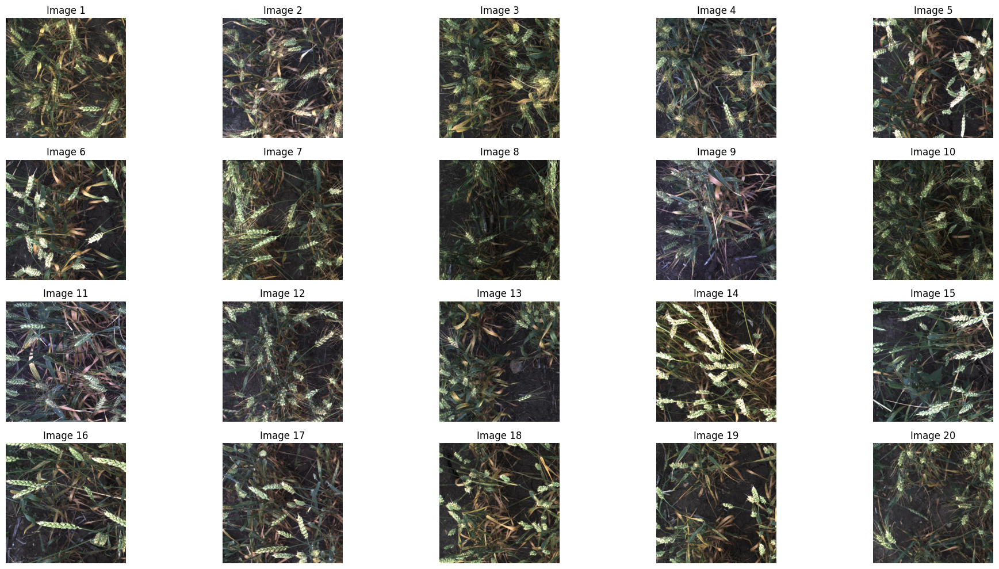

In [ ]:
unique_df = train.groupby('image_id').head(1).reset_index(drop=True)
first_20_images = unique_df.head(20)

fig, axes = plt.subplots(4, 5, figsize=(20, 10))
axes = axes.flatten()

for i in range(20):
    axes[i].imshow(first_20_images.iloc[i]['raw_image'])
    axes[i].set_title(f"Image {i + 1}")
    axes[i].axis('off')

plt.tight_layout()
plt.show()

Similarly, we extract the wheat head segments using bounding box coordinates.

In [ ]:
def load_wheat_image(col):
    xmin, ymin, width, height = map(int, col["literal_bbox"])
    return col['raw_image'][ymin:ymin + height, xmin:xmin + width]

train['raw_wheat_image'] = train.apply(load_wheat_image, axis=1)
train.head(5)

,image_id,width,height,bbox,source,literal_bbox,bbox_area,raw_image,raw_wheat_image
0,b6ab77fd7,1024,1024,"[834.0, 222.0, 56.0, 36.0]",usask_1,"[834, 222, 56, 36]",2016,"[[[26, 24, 25], [30, 28, 29], [36, 34, 35], [4...","[[[47, 46, 44], [43, 42, 40], [41, 40, 38], [4..."
1,b6ab77fd7,1024,1024,"[226.0, 548.0, 130.0, 58.0]",usask_1,"[226, 548, 130, 58]",7540,"[[[26, 24, 25], [30, 28, 29], [36, 34, 35], [4...","[[[81, 70, 50], [81, 73, 52], [80, 75, 53], [8..."
2,b6ab77fd7,1024,1024,"[377.0, 504.0, 74.0, 160.0]",usask_1,"[377, 504, 74, 160]",11840,"[[[26, 24, 25], [30, 28, 29], [36, 34, 35], [4...","[[[74, 63, 57], [74, 61, 55], [69, 56, 48], [6..."
3,b6ab77fd7,1024,1024,"[834.0, 95.0, 109.0, 107.0]",usask_1,"[834, 95, 109, 107]",11663,"[[[26, 24, 25], [30, 28, 29], [36, 34, 35], [4...","[[[49, 53, 54], [55, 57, 54], [52, 53, 47], [4..."
4,b6ab77fd7,1024,1024,"[26.0, 144.0, 124.0, 117.0]",usask_1,"[26, 144, 124, 117]",14508,"[[[26, 24, 25], [30, 28, 29], [36, 34, 35], [4...","[[[97, 89, 76], [80, 70, 60], [71, 61, 52], [8..."


And visualize a sample of the wheat head regions.

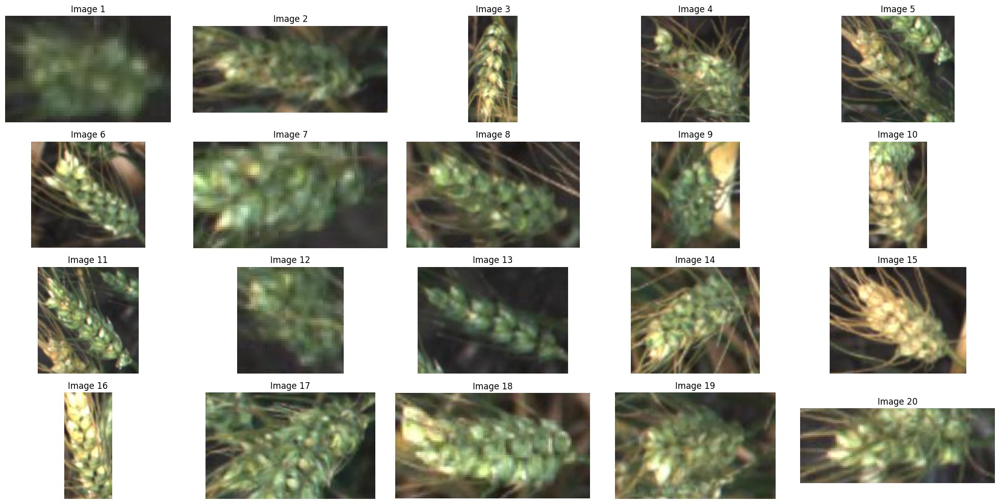

In [ ]:
num_images_to_show = min(20, len(train))

fig, axes = plt.subplots(4, 5, figsize=(20, 10))
axes = axes.flatten()

for i in range(num_images_to_show):
    axes[i].imshow(train.iloc[i]['raw_wheat_image'])
    axes[i].set_title(f"Image {i + 1}")
    axes[i].axis('off')

plt.tight_layout()
plt.show()

We compute brightness and contrast metrics to assess image quality variability. These analyses are important since lighting conditions directly affect detection performance.

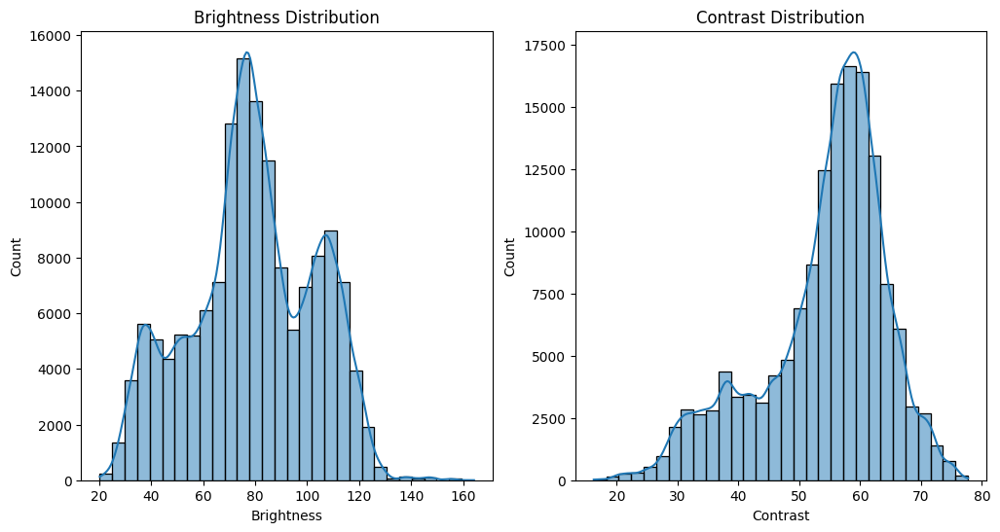

In [ ]:
### Brightness and Contrast Variability



def compute_brightness(image):
    return np.mean(cv2.cvtColor(image, cv2.COLOR_RGB2GRAY))

def compute_contrast(image):
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    return gray.std()

# Compute brightness and contrast for each image
train['brightness'] = train['raw_image'].apply(compute_brightness)
train['contrast'] = train['raw_image'].apply(compute_contrast)

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
sns.histplot(train['brightness'], bins=30, kde=True)
plt.title('Brightness Distribution')
plt.xlabel('Brightness')

plt.subplot(1, 2, 2)
sns.histplot(train['contrast'], bins=30, kde=True)
plt.title('Contrast Distribution')
plt.xlabel('Contrast')
plt.show()

We can see that the distribution is pretty normal and there are not too many outliners.

To further understand the dataset, we added an analysis of the bounding box aspect ratios (width/height).

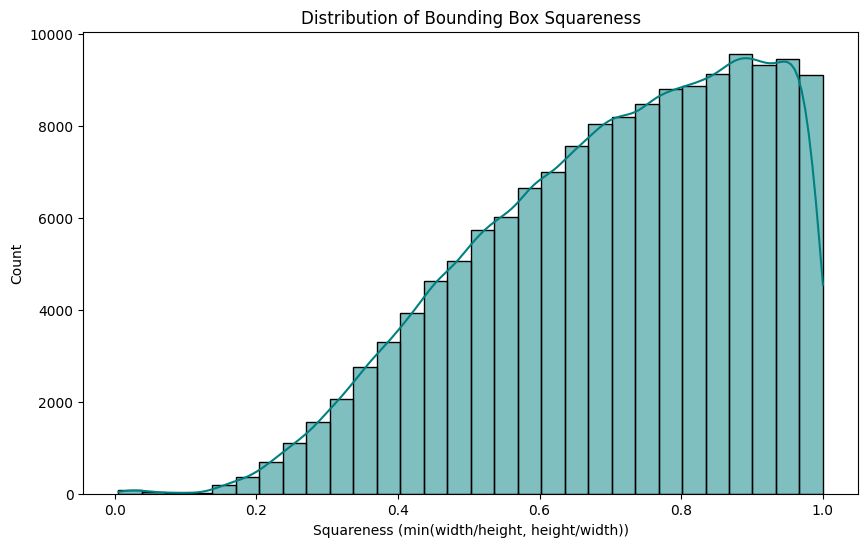

In [ ]:
# Calculate bounding box dimensions
train['bbox_width'] = train['literal_bbox'].apply(lambda x: int(x[2]))
train['bbox_height'] = train['literal_bbox'].apply(lambda x: int(x[3]))

# Compute squareness as the minimum of (width/height) and (height/width)
train['squareness'] = train.apply(lambda x: min(x['bbox_width'] / x['bbox_height'], x['bbox_height'] / x['bbox_width']), axis=1)

# Plot the squareness distribution
plt.figure(figsize=(10, 6))
sns.histplot(train['squareness'], bins=30, kde=True, color='teal')
plt.title('Distribution of Bounding Box Squareness')
plt.xlabel('Squareness (min(width/height, height/width))')
plt.show()


We know that wheats are in a rectangular but we see that the data shows the bbox to be more square. This might indicate that a lot of the wheats are diagonal and thus the bbox contains a lot of non-wheat inside it.

And a correlation heatmap among numerical features.

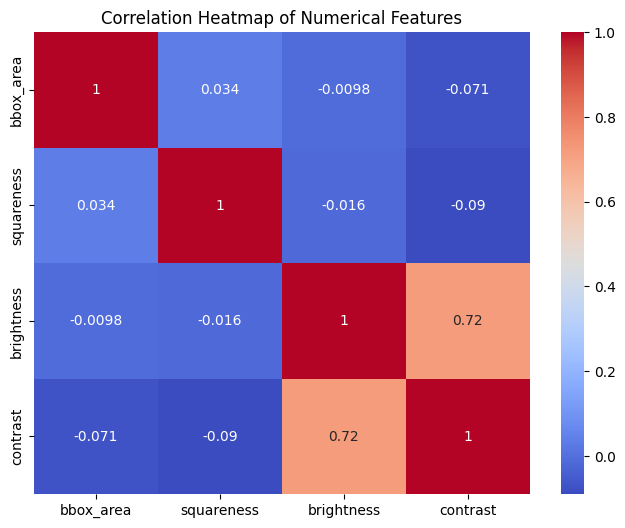

In [ ]:
# Correlation heatmap between key numerical features
numeric_features = ['bbox_area', 'squareness','brightness', 'contrast']
plt.figure(figsize=(8, 6))
sns.heatmap(train[numeric_features].corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap of Numerical Features')
plt.show()

To deepen our analysis of the dataset, we explored several classical computer vision techniques.

Harris Corner Detection identifies prominent corners, which are robust under rotation and scale changes. These corners serve as strong local features useful for image registration and matching.

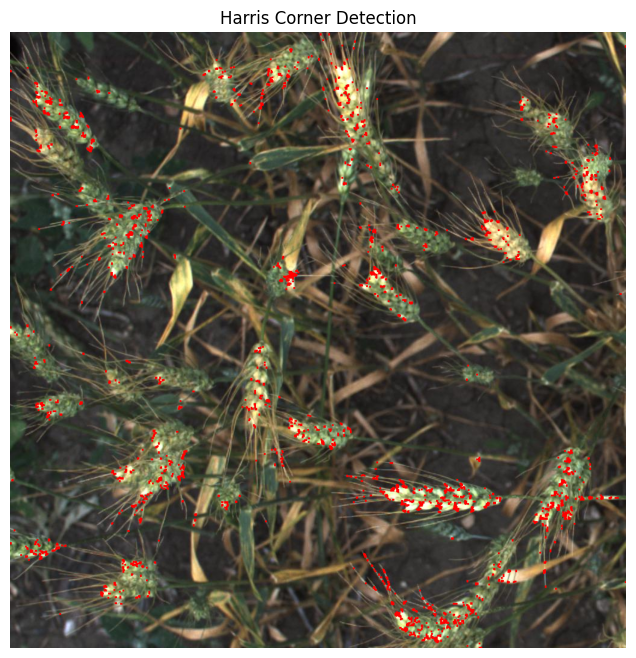

In [ ]:
### Harris Corner Detection

# Convert a sample image to grayscale
img = train['raw_image'].iloc[0]
img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
img_gray = np.float32(img_gray)

# Apply Harris Corner detection
dst = cv2.cornerHarris(img_gray, 2, 3, 0.04)
dst = cv2.dilate(dst, None)

# Mark corners on the image
img_corner = img.copy()
img_corner[dst > 0.01 * dst.max()] = [255, 0, 0]

plt.figure(figsize=(8, 8))
plt.imshow(img_corner)
plt.title('Harris Corner Detection')
plt.axis('off')
plt.show()

SIFT extracts keypoints and computes descriptors invariant to scale and rotation. This method is effective for matching features across images despite variations in illumination and perspective. By comparing SIFT keypoints, we assess similarities and differences in wheat head patterns.

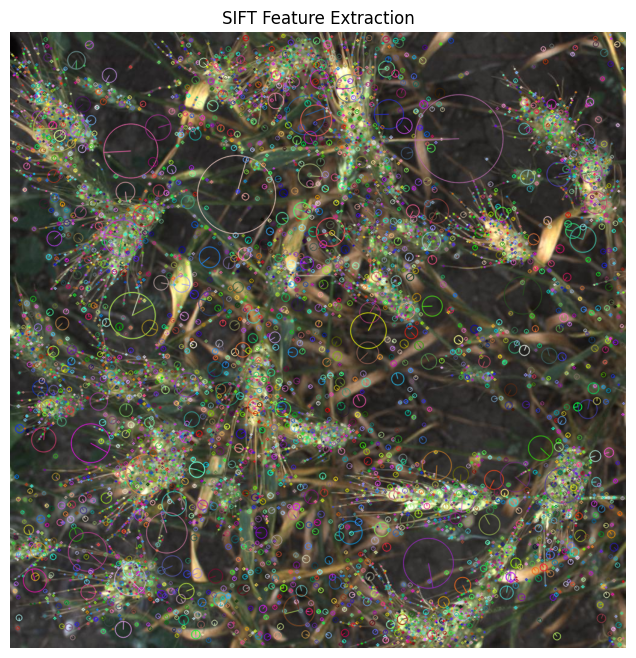

In [ ]:
### SIFT Feature Extraction
# Initialize SIFT detector
sift = cv2.SIFT_create()

# Convert image to grayscale
img_gray = cv2.cvtColor(train['raw_image'].iloc[0], cv2.COLOR_RGB2GRAY)

# Detect keypoints and compute descriptors
keypoints, descriptors = sift.detectAndCompute(img_gray, None)

# Draw keypoints on the image
img_sift = cv2.drawKeypoints(train['raw_image'].iloc[0], keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

plt.figure(figsize=(8, 8))
plt.imshow(img_sift)
plt.title('SIFT Feature Extraction')
plt.axis('off')
plt.show()


ORB is a computationally efficient alternative that combines the FAST keypoint detector with the BRIEF descriptor. It provides fast, robust feature extraction suitable for real-time applications. In our experiments, ORB facilitated quick matching and tracking between images.

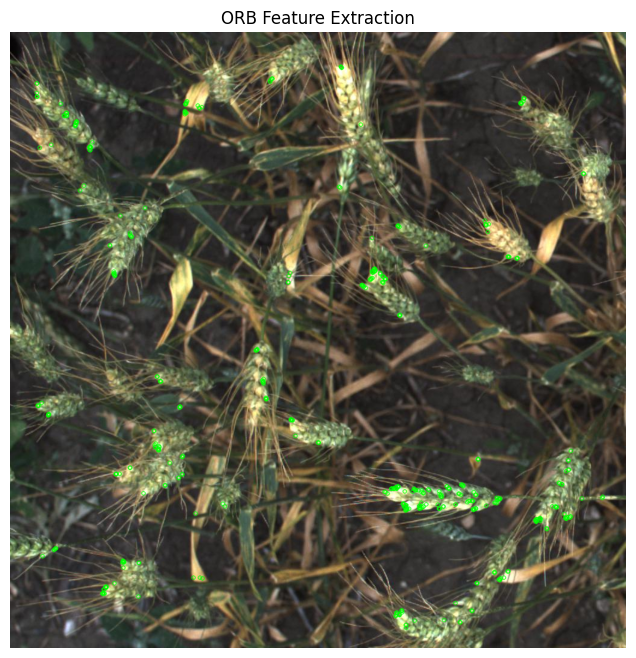

In [ ]:
# ORB Feature Extraction
orb = cv2.ORB_create()
img_gray = cv2.cvtColor(train['raw_image'].iloc[0], cv2.COLOR_RGB2GRAY)
keypoints_orb, descriptors_orb = orb.detectAndCompute(img_gray, None)
img_orb = cv2.drawKeypoints(train['raw_image'].iloc[0], keypoints_orb, None, color=(0,255,0), flags=0)
plt.figure(figsize=(8,8))
plt.imshow(img_orb)
plt.title('ORB Feature Extraction')
plt.axis('off')
plt.show()

HOG (Histogram of Oriented Gradients) captures the distribution of gradient orientations and is effective in describing object shapes and textures. It has been widely used in object detection tasks, such as pedestrian detection.

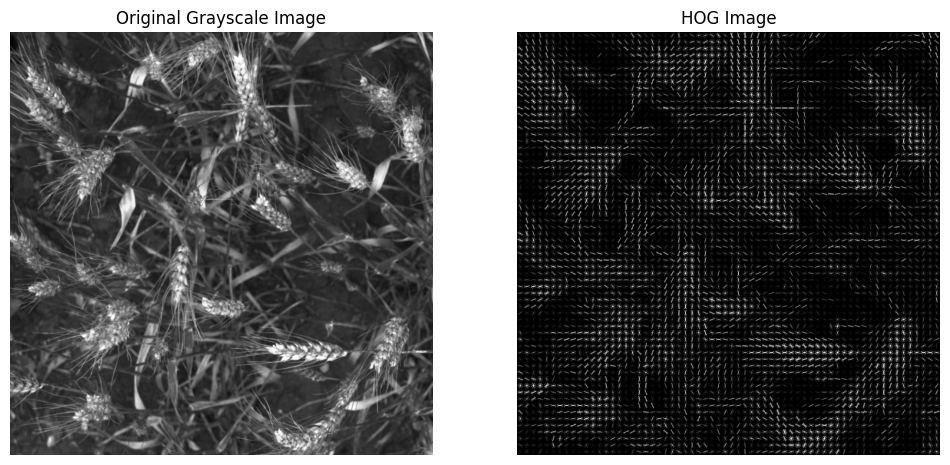

In [ ]:
# Convert a sample image to grayscale
sample_img = cv2.cvtColor(train['raw_image'].iloc[0], cv2.COLOR_RGB2GRAY)

# Compute HOG features and the HOG image for visualization
fd, hog_image = hog(sample_img,
                    orientations=8,
                    pixels_per_cell=(16, 16),
                    cells_per_block=(1, 1),
                    visualize=True,
                    channel_axis=None)

# Rescale HOG image for better display
hog_image_rescaled = exposure.rescale_intensity(hog_image, in_range=(0, 10))

# Display original grayscale image and the HOG image side by side
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(sample_img, cmap='gray')
plt.title("Original Grayscale Image")
plt.axis('off')
plt.subplot(1, 2, 2)
plt.imshow(hog_image_rescaled, cmap='gray')
plt.title("HOG Image")
plt.axis('off')
plt.show()

Canny Edge Detection is a multi-stage algorithm that detects a wide range of edges in images. It is beneficial for delineating object boundaries, such as the edges of wheat heads.

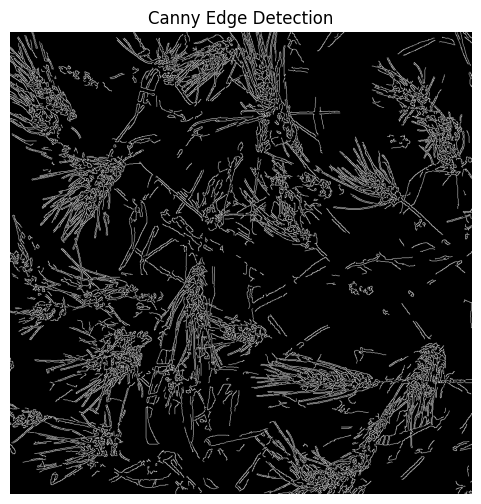

In [ ]:
# Apply Canny Edge Detection on the same sample image
edges = cv2.Canny(train['raw_image'].iloc[0], threshold1=100, threshold2=200)

# Display the edge-detected image
plt.figure(figsize=(6, 6))
plt.imshow(edges, cmap='gray')
plt.title("Canny Edge Detection")
plt.axis('off')
plt.show()


Building on the insights from classical feature extraction, this section introduces advanced methods to further enhance our detection pipeline. By integrating multiple sources of information, we can create a richer feature space and potentially improve model performance.

#### **Feature Engineering and Fusion**

In this section, we integrate multiple advanced techniques to enhance our detection pipeline. We extract classical features (using methods such as Bag-of-Visual-Words with SIFT, HOG, ORB, and Canny Edge Detection) and deep features (using a pre-trained ResNet18). By fusing these features, we aim to capture both local invariant patterns and high-level semantic information. We then perform dimensionality reduction and clustering to visualize and understand the combined feature space. Additionally, we demonstrate data augmentation and model interpretability using Grad-CAM. This integrated approach not only enriches our feature set but also provides insights into how each method contributes to our overall understanding of the dataset.

We begin by using SIFT to extract local descriptors from a subset of images and then cluster these descriptors with k-means to create a visual vocabulary. Each image is represented by a histogram of visual word occurrences, which forms the basis of our classical features.

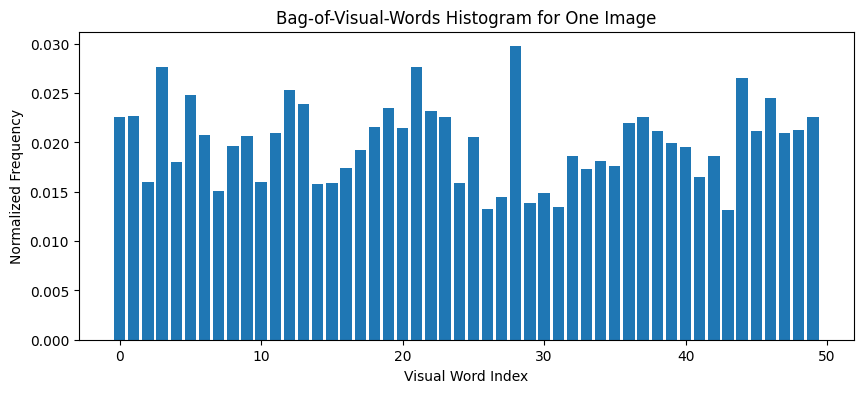

In [ ]:
# Initialize SIFT
sift = cv2.SIFT_create()

# Extract SIFT descriptors from a subset of images
descriptor_list = []
image_paths = glob.glob('/content/global-wheat-detection/train/*.jpg')[:50]

for path in image_paths:
    img = cv2.imread(path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    keypoints, des = sift.detectAndCompute(gray, None)
    if des is not None:
        descriptor_list.append(des)
    else:
        print(f"Warning: No SIFT descriptors found for image: {path}")

# Stack all descriptors vertically
if descriptor_list:
    descriptors = np.vstack(descriptor_list)
else:
    print("Error: No SIFT descriptors were extracted. Cannot proceed with clustering.")

# Cluster descriptors using k-means to form a visual vocabulary
n_clusters = 50
kmeans = MiniBatchKMeans(n_clusters=n_clusters, random_state=42)
kmeans.fit(descriptors)

# Function to build BoVW histogram for an image
def build_bovw_histogram(img_path, kmeans, sift):
    img = cv2.imread(img_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    keypoints, des = sift.detectAndCompute(gray, None)
    if des is None:
        return np.zeros(n_clusters)
    cluster_indices = kmeans.predict(des)
    hist, _ = np.histogram(cluster_indices, bins=np.arange(n_clusters+1))
    return hist

# Build histograms for each sampled image
bovw_features = []
for path in image_paths:
    hist = build_bovw_histogram(path, kmeans, sift)
    bovw_features.append(hist)
bovw_features = np.array(bovw_features).astype(np.float32)

# Normalize histograms
bovw_features /= (bovw_features.sum(axis=1, keepdims=True) + 1e-7)

# Visualize histogram for one image
plt.figure(figsize=(10, 4))
plt.bar(range(n_clusters), bovw_features[0])
plt.title("Bag-of-Visual-Words Histogram for One Image")
plt.xlabel("Visual Word Index")
plt.ylabel("Normalized Frequency")
plt.show()

Next, we can extract high-level semantic features from each image using a pre-trained ResNet18. We remove the final classification layer so that the model outputs a feature vector representing the image.

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 149MB/s]


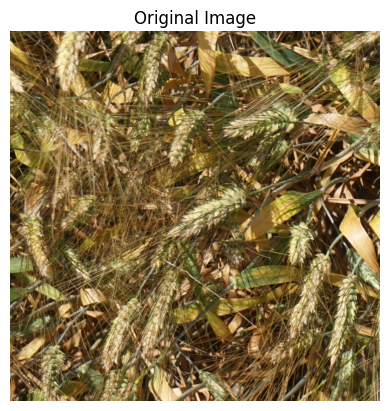

In [ ]:
# Load pre-trained ResNet18 model
resnet = models.resnet18(pretrained=True)
resnet.eval()  # Set to evaluation mode

# Define transformations to match ResNet18’s training input
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Choose an image to test
img_path = image_paths[0]  # Select a sample wheat image
img_pil = Image.open(img_path).convert("RGB")

# Apply transformation
img_tensor = transform(img_pil).unsqueeze(0)  # Add batch dimension

# Display the original image
plt.imshow(img_pil)
plt.axis('off')
plt.title("Original Image")
plt.show()

# Function to extract feature maps from a given layer
def get_feature_maps(model, img_tensor, layer_name):
    activation = {}

    def hook_fn(module, input, output):
        activation[layer_name] = output.detach()

    layer = dict(model.named_children())[layer_name]
    hook = layer.register_forward_hook(hook_fn)

    _ = model(img_tensor)  # Forward pass
    hook.remove()

    return activation[layer_name].squeeze(0)  # Remove batch dimension

# Extract feature maps from key layers
layer_names = ["conv1", "layer1", "layer2", "layer3", "layer4"]
feature_maps = {name: get_feature_maps(resnet, img_tensor, name) for name in layer_names}

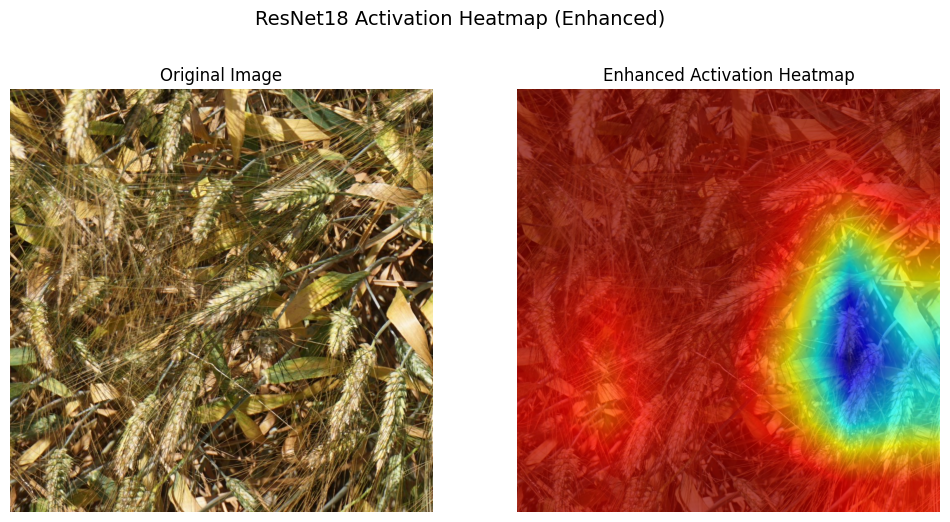

In [ ]:
def generate_activation_heatmap(feature_map, img_pil):
    """Generate an averaged activation heatmap for visualization."""
    img_np = np.array(img_pil)

    # Average across all feature maps to get a single activation map
    activation_map = feature_map.mean(dim=0).cpu().numpy()

    # Resize to match image size
    activation_map = cv2.resize(activation_map, (img_np.shape[1], img_np.shape[0]))

    # Apply a stronger contrast enhancement
    activation_map = (activation_map - activation_map.min()) / (activation_map.max() - activation_map.min() + 1e-7)
    activation_map = np.power(activation_map, 2)  # Apply gamma correction for better contrast
    activation_map = np.uint8(255 * activation_map)

    # Apply heatmap
    heatmap = cv2.applyColorMap(activation_map, cv2.COLORMAP_JET)

    # Blend with original image
    blended = cv2.addWeighted(img_np, 0.3, heatmap, 0.7, 0)  # Increase heatmap visibility

    return blended


# Choose an image to test
img_path = image_paths[0]  # Select a sample wheat image
img_pil = Image.open(img_path).convert("RGB")

# Apply heatmap on layer4
layer4_feature_map = feature_maps["layer4"]
heatmap_img = generate_activation_heatmap(layer4_feature_map, img_pil)

# Display results
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].imshow(img_pil)
axes[0].axis("off")
axes[0].set_title("Original Image")

axes[1].imshow(heatmap_img)
axes[1].axis("off")
axes[1].set_title("Enhanced Activation Heatmap")

plt.suptitle("ResNet18 Activation Heatmap (Enhanced)", fontsize=14)
plt.show()


We can see that the results are not too bad but not good enough to detect all different wheats. For that we will use more robust tools next.

###**External tool:**

We wanted to be able to run several tests and analyze the output in a convenient way, so we chose to connect W&B to help us analyze the output.

In [ ]:
wandb.login()

wandb: Using wandb-core as the SDK backend.  Please refer to https://wandb.me/wandb-core for more information.


<IPython.core.display.Javascript object>

In [ ]:
wandb.init(project="fasterrcnnResnet50Fpn", name="run_1")

wandb: Using wandb-core as the SDK backend.  Please refer to https://wandb.me/wandb-core for more information.


<IPython.core.display.Javascript object>

# **First attempt - Faster CNN Resnet-50**



Our first attempt will be to use the Faster CNN Resnet-50 algorithm to try and predict the wheats in the image.

Faster R-CNN with ResNet-50 is good model for wheat detection due to its combination of deep feature extraction and efficient object detection. ResNet-50, a 50-layer deep convolutional network, uses residual connections to avoid training issues in deep networks and is often pretrained on large datasets like ImageNet, making it effective for feature extraction even with limited data. Faster R-CNN enhances this by using a Region Proposal Network (RPN) to quickly identify and locate wheat in images. This makes the model both accurate and fast, well-suited for detecting complex objects like wheat in varying conditions.

### **Algorithm Implementation**

#### **Setup**

First, we'll define the WheatDataset which loads the actual image data.

In [ ]:
import os
import numpy as np
import pandas as pd
import torch
from torch.utils.data import DataLoader, Dataset
import cv2
from torchvision import transforms
from torchvision.models.detection.faster_rcnn import fasterrcnn_resnet50_fpn
from torchvision.transforms import functional as F

# Dataset class
class WheatDataset(Dataset):
    def __init__(self, dataframe, image_dir, transforms=None):
        self.dataframe = dataframe
        self.image_dir = image_dir
        self.transforms = transforms
        self.image_ids = dataframe['image_id'].unique()

    def __len__(self):
        return len(self.image_ids)

    def __getitem__(self, idx):
        image_id = self.image_ids[idx]
        records = self.dataframe[self.dataframe['image_id'] == image_id]

        # Load image
        image = cv2.imread(f"{self.image_dir}/{image_id}.jpg")
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32)
        image /= 255.0

        # Load boxes
        boxes = []
        for bbox in records['bbox']:
            bbox = bbox.strip('][').split(', ')
            boxes.append([float(bbox[0]), float(bbox[1]), float(bbox[0]) + float(bbox[2]), float(bbox[1]) + float(bbox[3])])
        boxes = torch.as_tensor(boxes, dtype=torch.float32)

        # Load labels (1 for wheat)
        labels = torch.ones((records.shape[0],), dtype=torch.int64)

        # Target dictionary
        target = {'boxes': boxes, 'labels': labels, 'image_id': image_id}

        if self.transforms:
            image = self.transforms(image)

        return image, target

# Load dataset
def get_train_transform():
    return transforms.Compose([transforms.ToTensor()])

train_df = pd.read_csv('/content/global-wheat-detection/train.csv')
image_dir = '/content/global-wheat-detection/train'
dataset = WheatDataset(train_df, image_dir, transforms=get_train_transform())

Now we'll define the actual model, basing it on PyTorches implementation of `FastRCNNPredictor`

In [ ]:
import torchvision
def get_model():
    model = fasterrcnn_resnet50_fpn(pretrained=True)
    num_classes = 2  # 1 class (wheat) + background
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    model.roi_heads.box_predictor = torchvision.models.detection.faster_rcnn.FastRCNNPredictor(in_features, num_classes)
    return model

model = get_model()

#### **Training**

In [ ]:
# Split the data into training and testing sets
train_data, test_data = train_test_split(train_df, test_size=0.2, random_state=42)

# Create datasets
train_dataset = WheatDataset(train_data, image_dir, transforms=get_train_transform())
test_dataset = WheatDataset(test_data, image_dir, transforms=get_train_transform())

# Create data loaders
train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True, collate_fn=lambda x: tuple(zip(*x)))
test_loader = DataLoader(test_dataset, batch_size=4, shuffle=False, collate_fn=lambda x: tuple(zip(*x)))

device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
model = get_model()
model.to(device)
optimizer = torch.optim.SGD(model.parameters(), lr=0.005, momentum=0.9, weight_decay=0.0005)
num_epochs = 10

# Training loop
%timeit
for epoch in range(num_epochs):
    model.train()
    for images, targets in tqdm.tqdm(train_loader):
        images = list(image.to(device) for image in images)
        targets = [{k: v.to(device) for k, v in t.items() if k != 'image_id'} for t in targets]

        loss_dict = model(images, targets)
        losses = sum(loss for loss in loss_dict.values())

        # log metrics to wandb
        wandb.log({"loss": losses, "epoch": epoch})

        optimizer.zero_grad()
        losses.backward()
        optimizer.step()
    print(f"Epoch {epoch+1}/{num_epochs}, Loss: {losses}")

#### **Testing**

In [ ]:
csv_file_path = '/content/global-wheat-detection/train.csv'
image_dir = '/content/global-wheat-detection/train'
annotation_file_path = '/content/global-wheat-detection/annotations.json'

We'll create COCO annotation file from our data

In [ ]:
def create_coco_annotation_file(csv_file_path, image_dir, output_file_path, test_image_ids):
    """
    Creates a COCO format annotation file from a CSV file containing bounding box information,
    using only images in the test set.

    Args:
        csv_file_path: Path to the CSV file.
        image_dir: Path to the directory containing the images.
        output_file_path: Path to save the COCO annotation file.
        test_image_ids: A list of image IDs belonging to the test set.

    Returns:
        image_id_to_coco_id: A dictionary mapping original image IDs to COCO image IDs.
    """

    df = pd.read_csv(csv_file_path)
    coco_annotations = {
        "images": [],
        "annotations": [],
        "categories": [{"id": 1, "name": "wheat"}]
    }

    image_id_to_coco_id = {}
    coco_image_id = 1
    annotation_id = 1

    for image_id in test_image_ids:
        image_info = {
            "id": coco_image_id,  # Assign coco_image_id as the image ID
            "file_name": f"{image_id}.jpg",
            "width": 1024,
            "height": 1024
        }
        coco_annotations["images"].append(image_info)

        image_id_to_coco_id[image_id] = coco_image_id  # Store mapping
        coco_image_id += 1

        image_bboxes = df[df['image_id'] == image_id]['bbox'].tolist()

        for bbox_str in image_bboxes:
            bbox = [float(coord) for coord in bbox_str.strip('][').split(', ')]
            annotation = {
                "id": annotation_id,
                "image_id": image_id_to_coco_id[image_id],  # Use coco_image_id from mapping
                "category_id": 1,
                "bbox": [bbox[0], bbox[1], bbox[2], bbox[3]],
                "area": bbox[2] * bbox[3],
                "iscrowd": 0
            }
            coco_annotations["annotations"].append(annotation)
            annotation_id += 1

    with open(output_file_path, 'w') as f:
        json.dump(coco_annotations, f, indent=4)

    print(f"COCO annotation file saved to: {output_file_path}")

    return image_id_to_coco_id  # Return the mapping


And a function to evaluate the model

In [ ]:
def evaluate_coco_metrics(model, test_loader, device, annotation_file_path, image_id_to_coco_id):
    """
    Evaluates a model on the test dataset using COCO metrics.

    Args:
        model: The trained model.
        test_loader: The DataLoader for the test dataset.
        device: The device to run the model on (e.g., 'cuda' or 'cpu').
        annotation_file_path: Path to the COCO format annotation file for the test dataset.
        image_id_to_coco_id: A dictionary mapping original image IDs to COCO image IDs.

    Returns:
        A COCOeval object containing the evaluation results.
    """

    model.eval()
    coco_gt = COCO(annotation_file_path)
    coco_dt = []

    with torch.no_grad():
        for images, targets in test_loader:
            images = list(image.to(device) for image in images)
            outputs = model(images)

            for i, output in enumerate(outputs):
                image_id = targets[i]['image_id']

                # Use the mapping to get the coco_image_id
                coco_image_id = image_id_to_coco_id[image_id]

                boxes = output['boxes'].cpu().numpy()
                scores = output['scores'].cpu().numpy()
                labels = output['labels'].cpu().numpy()

                for box, score, label in zip(boxes, scores, labels):
                    x, y, xmax, ymax = box
                    width = xmax - x
                    height = ymax - y

                    coco_dt.append({
                        'image_id': coco_image_id,  # Use coco_image_id from the mapping
                        'category_id': label,
                        'bbox': [x, y, width, height],
                        'score': score
                    })

    coco_dt = coco_gt.loadRes(coco_dt)
    coco_eval = COCOeval(coco_gt, coco_dt, 'bbox')
    coco_eval.evaluate()
    coco_eval.accumulate()
    coco_eval.summarize()

    return coco_eval


#### **Results**

We'll calculate the metrics like Average Precision and Average Recall of the model using the CoCo library.

In [ ]:
# Get the image IDs for the test set
test_image_ids = test_data['image_id'].unique().tolist()

# Create the annotation file and get the image_id_to_coco_id mapping
image_id_to_coco_id = create_coco_annotation_file(csv_file_path, image_dir, annotation_file_path, test_image_ids)

# Evaluate the model using the mapping
coco_eval = evaluate_coco_metrics(model, test_loader, device, annotation_file_path, image_id_to_coco_id)

# Print the evaluation stats
print(coco_eval.stats)

#### **Example**

Now we'll look at the model predicting the wheat bboxes on a test image.

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# Load and preprocess the image
image_path = '/content/global-wheat-detection/test/f5a1f0358.jpg'  # Replace with your image path
img = cv2.imread(image_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB).astype(np.float32)
img /= 255.0
transform = get_train_transform()
img_tensor = transform(img).unsqueeze(0).to(device)

# Perform inference
model.eval()
with torch.no_grad():
    prediction = model(img_tensor)

# Process predictions
boxes = prediction[0]['boxes'].cpu().numpy()
scores = prediction[0]['scores'].cpu().numpy()
labels = prediction[0]['labels'].cpu().numpy()

# Filter predictions based on a confidence threshold (e.g., 0.5)
threshold = 0.5
filtered_indices = scores > threshold
filtered_boxes = boxes[filtered_indices]
filtered_scores = scores[filtered_indices]

# Visualize the results
fig, ax = plt.subplots(1)
ax.imshow(img)

for box, score in zip(filtered_boxes, filtered_scores):
    xmin, ymin, xmax, ymax = box.astype(int)
    rect = patches.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin, linewidth=1, edgecolor='r', facecolor='none')
    ax.add_patch(rect)
    ax.text(xmin, ymin, f"{score:.2f}", color='r')

plt.show()

# **Second attempt - YOLOv5**


Another algorithm that we will try on our database is YOLOv5. We chose this algorithm because that is considered a fast, accurate and efficient algorithm. One of the reasons that it is fast and efficient is because it works as a single-stage detector where the image is scanned once. This is especially useful when working with a large dataset containing thousands of images, ensuring quick inference without compromising precision.

YOLOv5 should also be good because it is well-suited for detecting small and overlapping objects like the wheat heads in our images. Its multi-scale feature maps and anchor-based detection allow it to handle variations in wheat head size, density, and orientation. Additionally, it incorporates data augmentation techniques such as mosaic augmentation, random scaling, and flipping, which help the model generalize better to different environmental conditions, lighting variations, and genotypes.

Another key advantage is its simplicity. Built on PyTorch, it allows for easy fine-tuning and training on custom datasets, making it easy to use in our project and giving us the option to further implement it in videos in the future because it was originally created for that input.

Versions 1-4 of YOLO are implemented in C and version 5 is the first one to be implemented in Python using PyTorch thus is why we chose it. This algorithm uses several layers of processing to achieve a good recognition score. Lets breack down the algorithm:

## **Pre data augmentation:**

### **Mosaics**

YOLOv5 takes the images and Implements the Mosaic method. This method takes the images from the data set, takes them apart and rebuilds them with each other. this method helps to normalize the data in each image and spread the information inside the image. This is good for our data set because it is characterized with a lot of small heads that are generally scattered but sometimes there are empty spots of ground that don't have any wheat heads in them.

Here you can see some examples of the Mosaics stage that the algorithm produced  while it was running. these images were extracted from W&B after the algorithm finished running:


 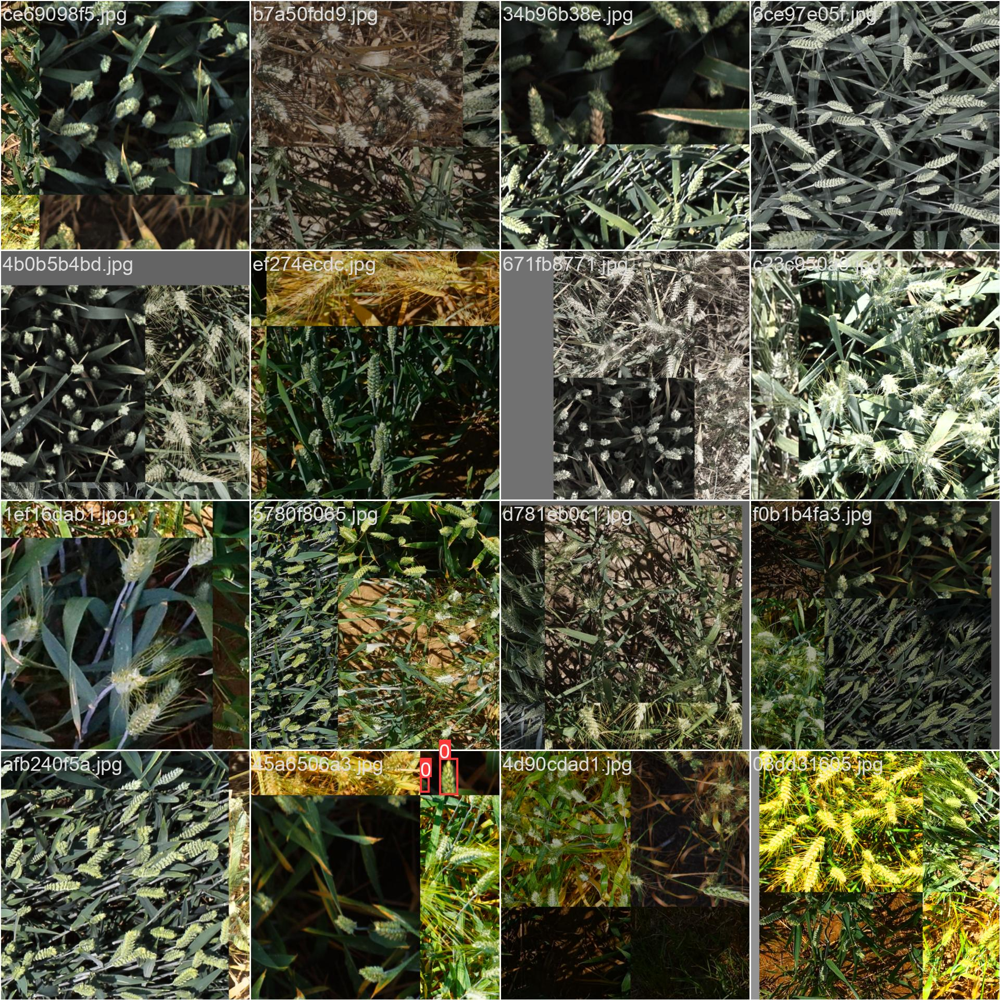

### **Scaling and Transformations**


YOLOv5 takes the images and transforms them in different ways to create a bigger diversity that could help make the classification stronger. This is done in several ways: centering images or shifting them in the image helps the convolution matrix to deal with loss of information in the edges of the image. Rotating images and scaling them by zooming in/out helps to make a bigger dataset with a more diverse input. This refactoring is done by multiplying the images with different transformation matrixes and saving the output as the new image.

To do this, the algorithm uses the library "utils.augmentations":
```
from utils.augmentations import (
    Albumentations,
    augment_hsv,
    classify_albumentations,
    classify_transforms,
    copy_paste,
    letterbox,
    mixup,
    random_perspective,
)
```



## **Algorithm implementation**



The algorithm divides the image into a grid and tries to classify each cube to the most accurate class (in our case "wheat" or "not wheat". YOLOv5 processes the entire image at once using a series of convolutional neural networks (CNN), making it extremely fast and efficient. The network's output is bounding box coordinates, confidence scores (indicating the likelihood of an object), and class probabilities for each detected object.

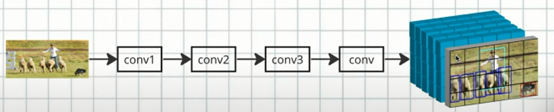

There are 5 different sub YOLOv5 algorithms, we chose to work with the most simple one YOLOv5s but as seen in the next image the heavier sub-modules have an even better output:

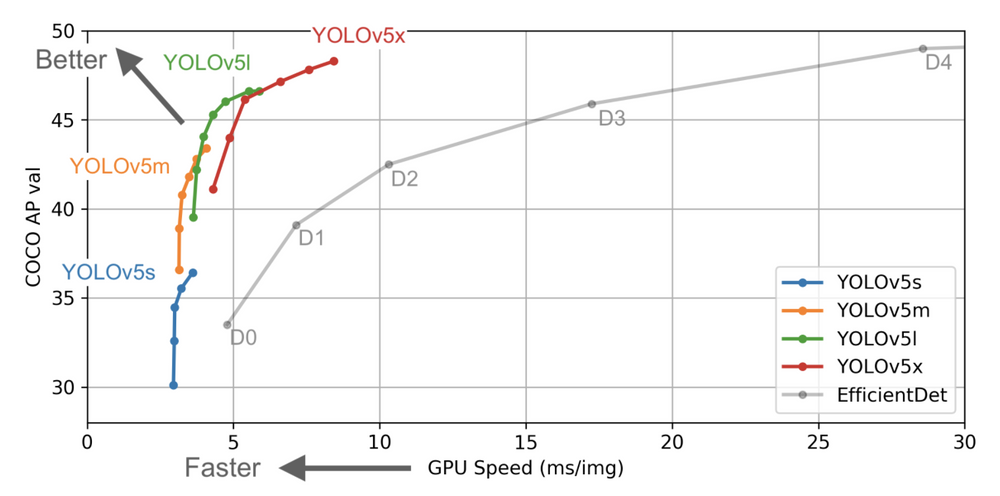

Now we will Install the algorithm from the open source git ripo:

In [ ]:
# Install YOLOv5
if not os.path.exists('content/yolov5'):
  !git clone https://github.com/ultralytics/yolov5
  %cd yolov5
  !pip install -r requirements.txt

We need to creat the folders and labels in the format that YOLOv5 uses. each image has it's own label with the informathon for it from the .csv file.

The information is translated and normelized by x,y, hight, width:

In [ ]:
def create_yolo_labels(df, image_dir, output_dir):
    """
    Creates YOLOv5-compatible label files (.txt) for each image in the DataFrame.

    Args:
      df: DataFrame containing image information and bounding boxes.
      image_dir: Directory containing the images.
      output_dir: Directory to save the generated label files.
    """

    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    for image_id, group in df.groupby('image_id'):
        img_path = os.path.join(image_dir, f'{image_id}.jpg')
        if not os.path.exists(img_path):
          print(f"Warning: Image file not found for {image_id}. Skipping.")
          continue

        with open(os.path.join(output_dir, f'{image_id}.txt'), 'w') as f:
          for _, row in group.iterrows():
            xmin, ymin, width, height = row['literal_bbox']
            # YOLO format: class_id x_center y_center width height (normalized)
            img_width = row['width']
            img_height = row['height']
            x_center = (xmin + width / 2) / img_width
            y_center = (ymin + height / 2) / img_height
            w = width / img_width
            h = height / img_height

            f.write(f"0 {x_center} {y_center} {w} {h}\n") # Assuming class_id is 0 for wheat

image_dir = '/content/global-wheat-detection/train'
output_labels_dir = '/content/yolo_labels'
create_yolo_labels(train, image_dir, output_labels_dir)

Now we need to take the labels and bould a file directory in the matching format for YOLOv5. The directory should look like this:

    ├── images
    │   ├── train
    │   │   ├── image1.jpg
    │   │   └── image2.jpg
    │    val
    │       ├── image3.jpg
    │       └── image4.jpg
    └── labels
        ├── train
        │   ├── image1.txt
        │   └── image2.txt
        └── val
            ├── image3.txt
            └── image4.txt


We will save the directory in a new folder:

In [ ]:
def create_yolo_dataset(labels_dir, images_dir, output_dir, train_ratio=0.8):
    """
    Creates a YOLOv5 dataset directory structure with train and val splits.

    Args:
        labels_dir: Path to the directory containing YOLO format label files (.txt).
        images_dir: Path to the directory containing the corresponding images (.jpg).
        output_dir: Path to the directory where the YOLOv5 dataset will be created.
        train_ratio: Ratio of data to be used for training (default: 0.8).
    """

    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    train_dir = os.path.join(output_dir, 'train')
    val_dir = os.path.join(output_dir, 'val')
    os.makedirs(train_dir, exist_ok=True)
    os.makedirs(val_dir, exist_ok=True)
    os.makedirs(os.path.join(train_dir, 'images'), exist_ok=True)
    os.makedirs(os.path.join(train_dir, 'labels'), exist_ok=True)
    os.makedirs(os.path.join(val_dir, 'images'), exist_ok=True)
    os.makedirs(os.path.join(val_dir, 'labels'), exist_ok=True)

    image_files = [f for f in os.listdir(images_dir) if f.endswith('.jpg')]
    random.shuffle(image_files)
    num_train = int(len(image_files) * train_ratio)


    for i, image_file in enumerate(image_files):
        image_id = image_file[:-4]  # Remove the .jpg extension
        label_file = f"{image_id}.txt"

        source_image_path = os.path.join(images_dir, image_file)
        source_label_path = os.path.join(labels_dir, label_file)

        if i < num_train:
            destination_image_path = os.path.join(train_dir, 'images', image_file)
            destination_label_path = os.path.join(train_dir, 'labels', label_file)
        else:
            destination_image_path = os.path.join(val_dir, 'images', image_file)
            destination_label_path = os.path.join(val_dir, 'labels', label_file)

        if os.path.exists(source_image_path) and os.path.exists(source_label_path):
            shutil.copy(source_image_path, destination_image_path)
            shutil.copy(source_label_path, destination_label_path)

labels_directory = '/content/yolo_labels'
images_directory = '/content/global-wheat-detection/train'
output_directory = '/content/yolo_data_test4'
create_yolo_dataset(labels_directory, images_directory, output_directory)

Now we will create a .yaml file that will store the relevant path to the datasets and run the algorithm for 10 epochs:

In [ ]:
!echo "train: /content/yolo_data_test4/train" > data.yaml
!echo "val: /content/yolo_data_test4/val" >> data.yaml
!echo "nc: 1" >> data.yaml
!echo "names: ['h']" >> data.yaml

# Train the model:
!python train.py --img 640 --batch 16 --epochs 10 --data data.yaml --weights yolov5s.pt --cache

##**Analyzing the output**

After a couple of hours the algorithm finally finished and we can start analyzing  the data.

We will start with the W&B summary tool that gives us an overall picture of the algorithm's score:

wandb: Run summary:

wandb:           best/epoch 9

**wandb:         best/mAP_0.5 0.93961**

wandb:    best/mAP_0.5:0.95 0.52591

**wandb:       best/precision 0.92413**

**wandb:          best/recall 0.88237**

wandb:      metrics/mAP_0.5 0.9396

wandb: metrics/mAP_0.5:0.95 0.52587

wandb:    metrics/precision 0.92411

wandb:       metrics/recall 0.8822

The most important variables are marked in bold:

Best/mAP_0.5 is the Mean Average Precision at an Intersection over Union (IoU) threshold of 0.5. In other words, this is the balance between precision (avoiding false positives) and recall (capturing true positives). The high value we got indicates that the model is highly accurate in detecting objects.

Best/precision is the proportion of predictions that are true positives (TP) out of all positive predictions (TP + FP). The high score means that the model makes very few false positive detections.

Best/recall is the proportion of actual objects correctly detected by the model (TP / (TP + FN)). Her too, we got a high score that indicates that the model is good at detecting most objects, although some might still be missed.

Lets visualize the output. Her we show the generated bboxs that the algorithm produced (red) are pretty accurate copared to the given bboxs in the dataset csv file (blue):

In [ ]:
%cd /content/yolov5

test_images_dir = '/content/global-wheat-detection/test'

def show_results(img_path, size=(50,50)):
  results = yolov5_model(img_path)
  results.print()
  results.show()
  results.save(save_dir='inference/output') # Save results to an output folder
  img = cv2.imread(img_path)
  img = cv2.resize(img, size)
  plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
  plt.show()

yolov5_model = torch.hub.load('.', 'custom', path='runs/train/exp/weights/best.pt', source='local')

for img_path in glob.glob(os.path.join(test_images_dir, '*.jpg')):
    print(f"Processing image: {img_path}")
    show_results(img_path)


 This is what we expected to see after looking at the results of the algorithm. We can conclude that the algorithm did a good job. we also notice that the algorithm tends to identify the same wheat head as multiple heads but does get a good overall coverage of the wheat heads

##Further analizing:

Now that we so that YOLOv5 succeeded in getting good grades on the data set we want to try and challenge it a bit more. This algorithm was originally created to run on live videos and can calculate BBOXs at high speeds. One of the ways that farmers can use this research in the future is by taking a drone to fly up and down their field and give them an estimation of how much wheat is growing in the field.

To show how this might be used we searched the web and found a video of a field of wheat that was taken in Kansas, US on 2015. We then took the video and gave it as an input to the weights that were previously calculated by the YOLOv5 algorithm based on the given dataset.

Here we load the model and run it on the video frame by frame:


In [ ]:
GOOGLE_DRIVE_ID = "17KGW2ZgBvjS5RRveGCyNgEroEyOR8cCF"
gdown.download(id=GOOGLE_DRIVE_ID)

model = torch.hub.load('ultralytics/yolov5', 'custom', path='/content/yolov5/runs/train/exp/weights/best.pt')

video_path = '/content/Wheat_field_in_Kansas.mp4'
cap = cv2.VideoCapture(video_path)
fps = cap.get(cv2.CAP_PROP_FPS)
frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

output_video_path = '/content/Wheat_field_in_Kansas_output.mp4'
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
out = cv2.VideoWriter(output_video_path, fourcc, fps, (frame_width, frame_height))

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break
    results = model(frame)
    annotated_frame = results.render()[0]
    out.write(annotated_frame)

cap.release()
out.release()
cv2.destroyAllWindows()

After running the model on the video our output is a new video that shows the calculated BBOXs over the original video. To help us get an understanding of how good the algorithm was we will show a couple frames from different parts of the video:


In [ ]:
%matplotlib inline

video_path = '/content/Wheat_field_in_Kansas_output.mp4'
cap = cv2.VideoCapture(video_path)
selected_frames = []

frame_count = 0
while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    if frame_count % 300 == 0:
        selected_frames.append(frame)

    frame_count += 1

cap.release()

n_cols = 2
n_rows = (len(selected_frames) + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(80, 60))

for i, frame in enumerate(selected_frames):
    row = i // n_cols
    col = i % n_cols
    axes[row, col].imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
    axes[row, col].axis('off')

for i in range(len(selected_frames), n_rows * n_cols):
    row = i // n_cols
    col = i % n_cols
    axes[row, col].axis('off')

plt.tight_layout()
plt.show()


As we can see the algorithm did a pretty good job! Most of the BBOXs are located around real wheat heads. We do see that some of the BBOXs are randomly scattered in the field and some also seem to appear in the sky as clouds.

After carefully looking through the whole video we can say that the algorithm did well given the fact that the video was taken in a new region that the algorithm didn’t practice on. Also, the angle that the video was take from was from the side and contained parts with the sky that the algorithm never practiced on because all the images in the data set were taken from above.


# Algorithm comparison

#### **User-Friendliness and Integrations**
YOLOv5 seems to be much more user-friendly. Its implementation offers integration with tools like Weights & Biases (Wandb) for experiment tracking and visualization. This integration simplifies the process of monitoring training progress, logging metrics, and comparing different model configurations.

Faster R-CNN ResNet-50, while powerful, requires more manual setup and integration with external tools. This introduces additional complexity, especially those new to object detection frameworks. Evaluating the model using COCO metrics, for instance, necessitates writing custom functions to convert data formats and interface with the COCO API.

#### **Flexibility and Customization**
The inherent trade-off for YOLOv5's user-friendliness is a slight reduction in flexibility compared to Faster R-CNN ResNet-50. YOLOv5's integrated approach makes it more challenging to modify specific components or customize the architecture to a high degree.

Faster R-CNN ResNet-50, on the other hand, allows for greater flexibility. Users can modify the backbone network, region proposal network (RPN), or the classification and regression heads to suit their specific needs. This level of customization is advantageous for research and development or when adapting the model to unique datasets or tasks.


#### **Technical Differences**
Faster R-CNN ResNet-50 is a two-stage object detector. It first uses a Region Proposal Network (RPN) to generate potential bounding boxes containing objects. These proposals are then fed to a classifier and regressor to refine the boxes and predict object classes. This two-stage approach generally leads to higher accuracy but can be slower than single-stage detectors. ResNet-50 serves as the backbone network, extracting features from the input image.

YOLOv5 is a single-stage object detector. It directly predicts bounding boxes and class probabilities from a grid of cells overlaid on the input image. This approach makes it faster but may sometimes compromise accuracy compared to two-stage detectors. YOLOv5 incorporates several architectural innovations, such as CSPDarknet53 for feature extraction and a Path Aggregation Network (PANet) for feature fusion, contributing to its speed and efficiency.

#### **Results and Performance**
Despite expectations based on our readings that suggested YOLOv5 might have lower performance compared to Faster R-CNN ResNet-50, our results demonstrate a comparable performance with a slight edge for YOLOv5.

Here's a summary of the key metrics:

| Metric         | Faster R-CNN ResNet-50 | YOLOv5 |
|----------------|------------------------|--------|
| mAP@[.5:.95]   | 0.515                  | 0.52591|
| mAP@.5         | 0.937                  | 0.93961|
| Precision      | -                      | 0.92413|
| Recall         | 0.596                  | 0.88237|

YOLOv5 achieved a slightly higher overall average precision (mAP@[.5:.95]) and significantly better recall while maintaining a high precision. This indicates that YOLOv5 was both accurate and comprehensive in detecting wheat in the images.

#Future thoughts

As part of future research, we can try to enlarge our dataset with images from other countries to try to get a better generalization across environments. By doing so, we can develop models that are robust across diverse geographical locations and growing conditions. Also, it might be interesting to try and ignore the "origin" information field and see how the algorithms output will look thinking all images were taken in the same area.

Another way to try and take our research to new areas is to try identifying other parameters of the wheat, for example trying to identify healthy or sick wheat leaves. This information could help farmers in the future use automated drones to scan their fields on a weekly base to identify sick plants in an early stage and treat them before it is too late.

The example we did with the video showed that there is good potential for implementing the model on a video. With a more suitable database that is focused on videos taken horizontally from a drone's point of view we believe that we could succeed to get a good result.


# **Conclusions**

We think we got this result because our dataset was not complicated enough for both algorithms. We think this is also what made made their differences stand out less.

Comparing both algorithms, YOLOv5 and Faster R-CNN with ResNet-50 on our dataset gave us a good understanding of their strengths and weaknesses as algorithms. YOLOv5 demonstrated higher speed and better efficiency, which was expected because it is originally suited for real-time applications like live cameras. Its lightweight architecture and high inference speed enabled fast object detection. YOLOv5 was good at detecting objects quickly but it struggled with detecting the smaller and overlapping wheat heads. This could be because of how it implements a grid-based prediction approach. Faster R-CNN with ResNet-50 provided an accurate detection, particularly in images with many wheat heads. Its region proposal network (RPN) enables a detailed analysis of potential object locations, which lead to higher precision with densed images.

#** Self reflection**

For both of us, this project was a fascinating and rewarding experience. When we first chose the topic and started studying the database we were amazed at how much depth there could be  in such an ordinary database. During the semester we made sure to meet on Zoom once a week to divide subtasks, share our progress and plan the next stages in our research. We both took this course in the same mindset - To try out new machine learning tools and learn how to analyze datasets, and we both feel like we had the chance to do so.

On a personal note:


For me, Avraham Toubi, trying out new tools and libraries in Python was a highlight of this assignment. The challenge of understanding how these tools work and applying them to preprocess the data, build models, and evaluate results was very teaching. This hands-on experience taught me the importance of choosing the right tools for specific tasks and how they can help me solve the problems I'm facing. I feel that this assignment sparked a desire in me to further explore database research using machine learning.

For me, Danil Delegator, this project has been an eye-opening experience. The data science ecosystem is vast, with so many powerful tools and resources available out of the box. It was fascinating to see how quickly we could build something effective using these tools. One of the most exciting moments was after a long training run, when we finally saw the model produce accurate results—there’s something incredibly satisfying about that.

